In this notebook, we are going to build a computer vision model for identifying lane lines in road images.
+ Camera calibration
+ Distortion correction
+ Extracting lane line pixels using color thresholding
+ Perspective transformation
+ Calculating lane curvature
+ Producing output images and videos with highlighted lane lines

In [28]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import glob
import os
from moviepy.editor import VideoFileClip
from camera import *
from lane_detect import *
from IPython.display import HTML
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Camera calibration

In [19]:
camera_calibrate()

Calibration Done.


## A quick test on one image

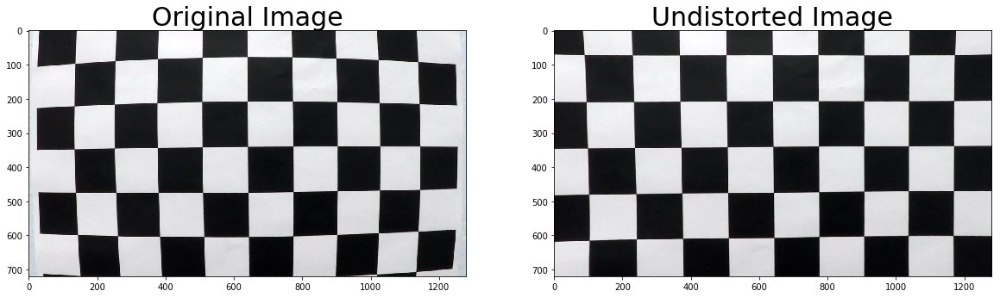

In [23]:
# Test undistortion on an image
img = cv2.imread('camera_cal/calibration1.jpg')
dst = correctCameraDistortion(img)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

## Test the distortion correction pipeline

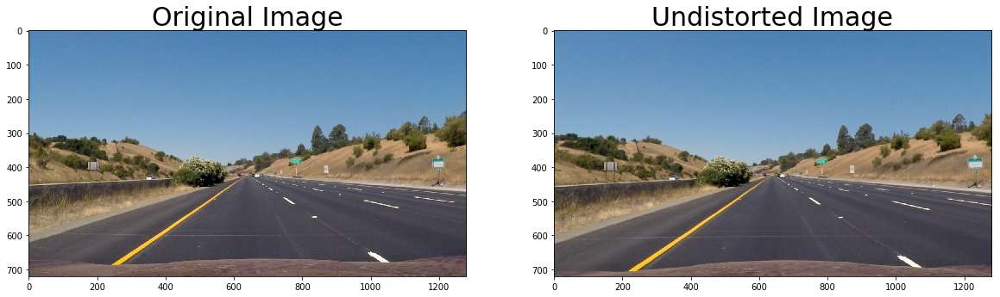

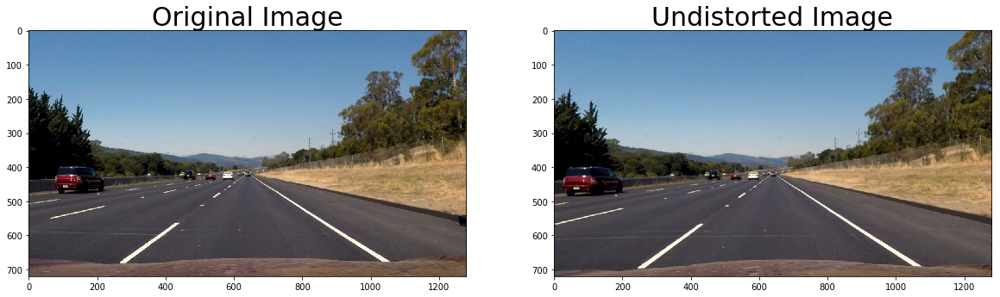

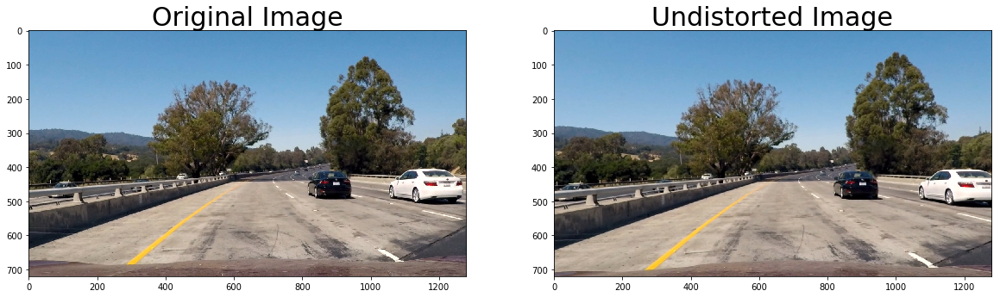

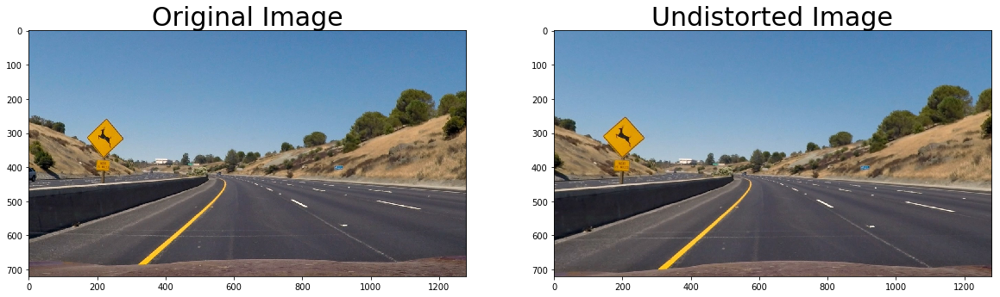

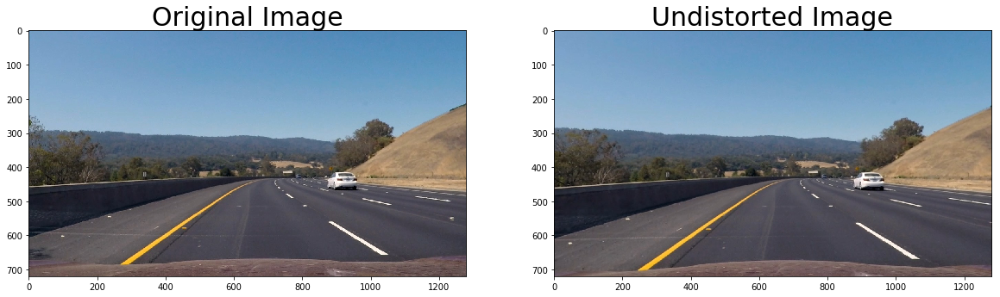

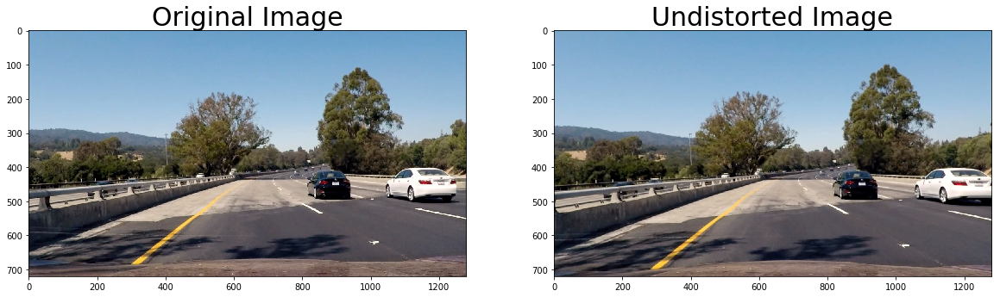

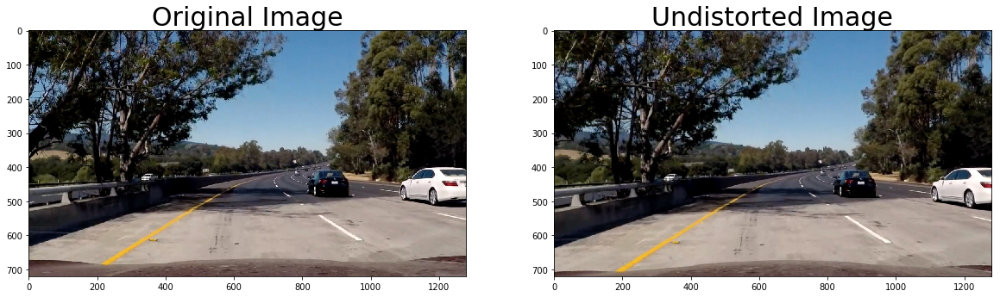

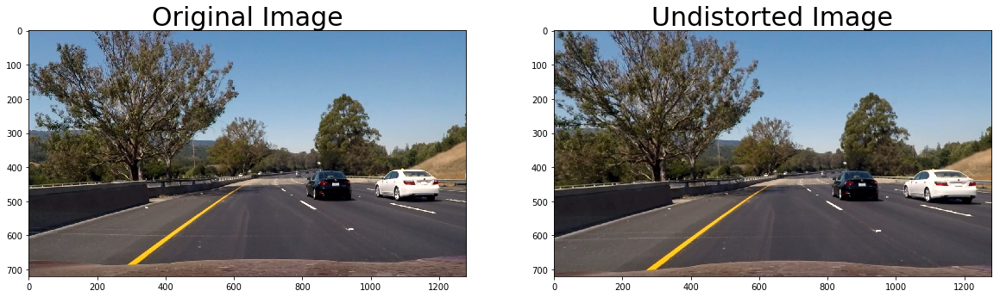

In [24]:
images = glob.glob('test_images/*.jpg')
for name in images:
    image = mpimg.imread(name)
    dst = correctCameraDistortion(image)
    if not os.path.exists('test_images_output'):
        os.makedirs('test_images_output')
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    cv2.imwrite('test_images_output/'+ name.split('/')[1], dst)

## Test color gradient pipeline

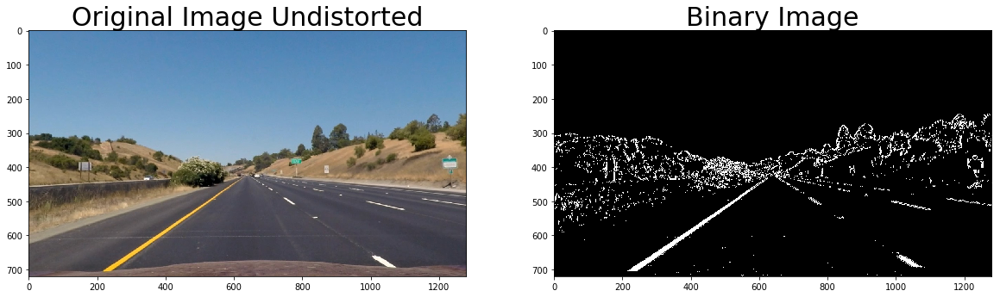

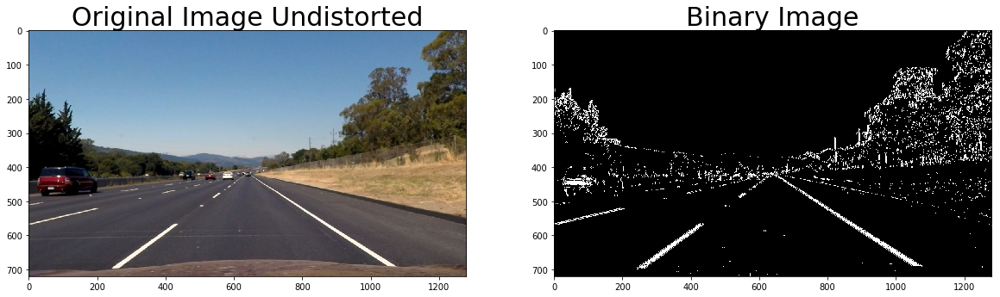

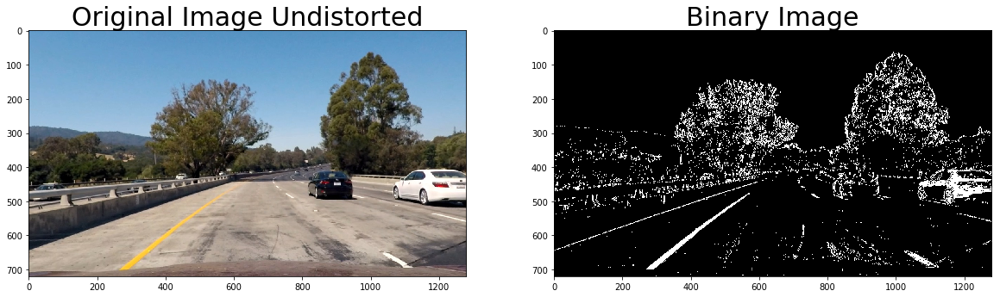

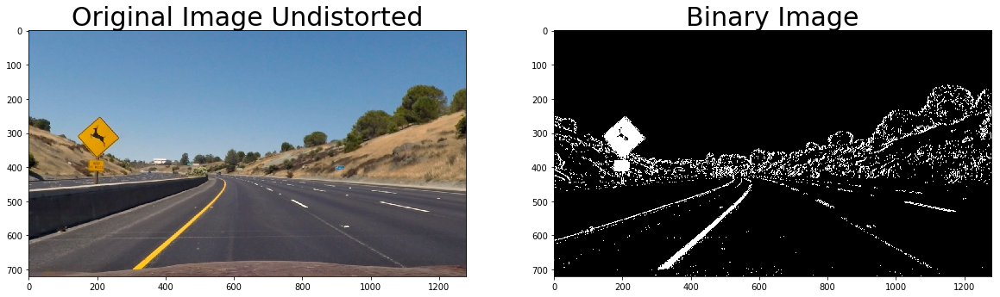

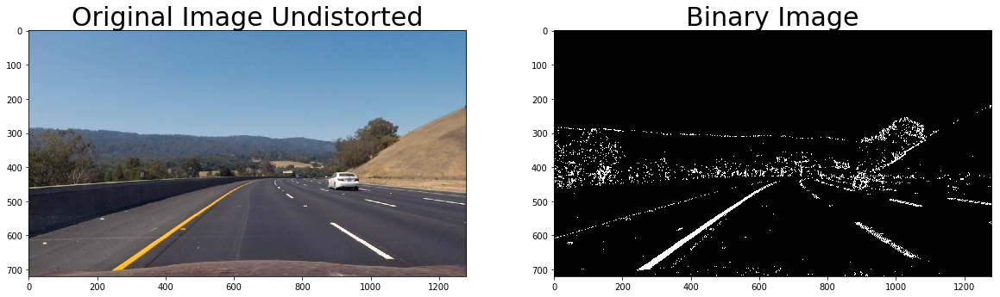

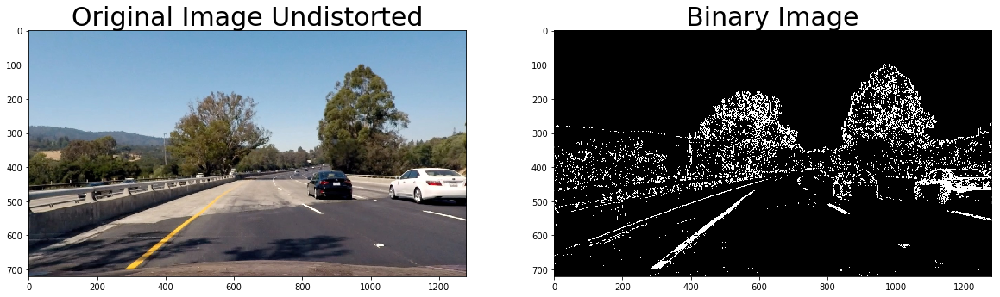

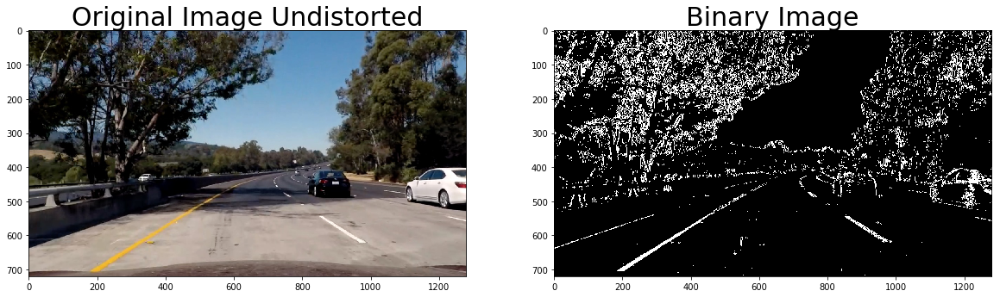

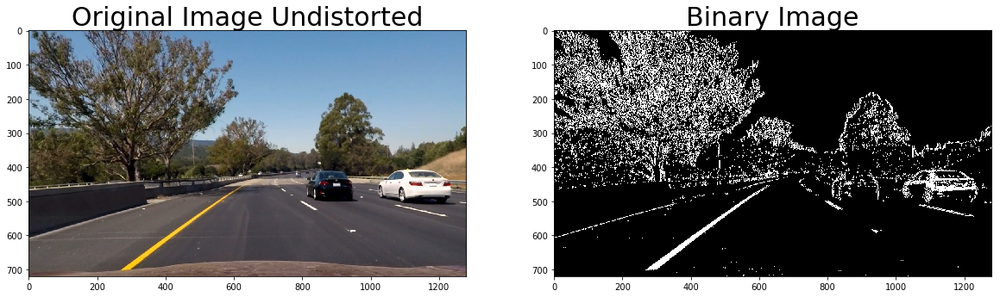

In [25]:
raw_images = glob.glob('test_images/*.jpg')
for image_name in raw_images:
    image = mpimg.imread(image_name)
    dst = correctCameraDistortion(image)
    binary_img = color_gradient_pipeline(dst, sx_thresh = (20, 100),
                                         s_thresh = (170, 255),
                                         l_thresh = (30, 255))
    
    cv2.imwrite('./test_images_output/test_images_binary/'+image_name, binary_img)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(dst)
    ax1.set_title('Original Image Undistorted', fontsize=30)
    ax2.imshow(binary_img, cmap="gray")
    ax2.set_title('Binary Image', fontsize=30)

In [ ]:
def imagePipeline(file_name):
    '''
    Takes an image, object points, and image points
    performs the camera calibration, image distortion correction and
    returns the undistorted image
    '''
#     image = mpimg.imread(image_name)
    image = cv2.imread(file_name)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    dst = correctCameraDistortion(image)
    binary_img = color_gradient_pipeline(dst)
    return binary_img

## Project the Image into a Birds-eye view

(720, 1280, 3)


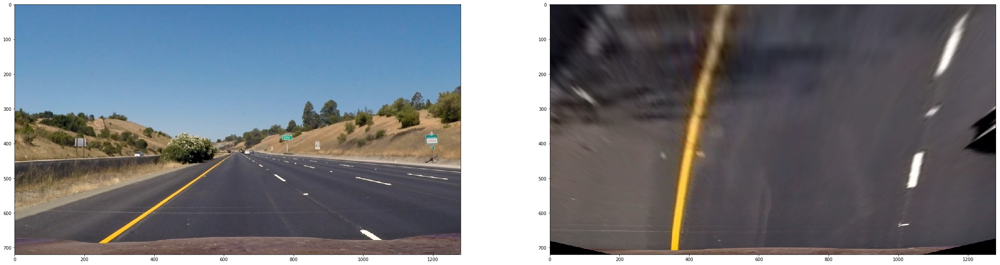

In [26]:
fname = 'test_images/straight_lines1.jpg'
img = cv2.imread(fname)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

src = np.float32([[585, 460], [203, 720], [1127, 720], [695, 460]])
dst = np.float32([[320, 0], [320, 720], [960,720], [960, 0]])
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
img_size = (image.shape[1], image.shape[0])
binary_warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)
print(binary_warped.shape)
f, axes = plt.subplots(1, 2, figsize=(40, 20))
axes[0].imshow(img)
axes[1].imshow(binary_warped)

plt.show()

In [ ]:
for image_name in raw_images:
    file_name='test_images/'+image_name
    image = imagePipeline(file_name)
    warped=projectImageToBird(image)
    # Visualize Warped Image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Binary Image', fontsize=30)
    ax2.imshow(warped)
    ax2.set_title('Warped Image', fontsize=30)

## Detect lane pixels and fit to find the lane boundary

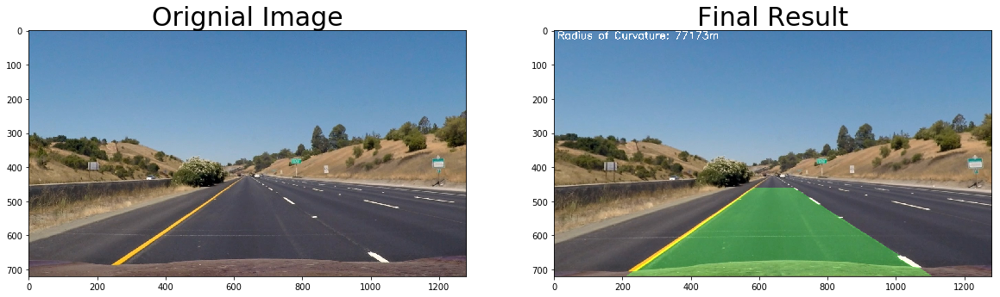

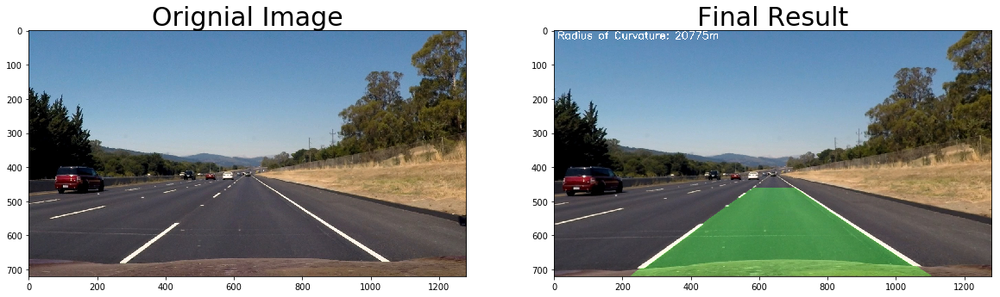

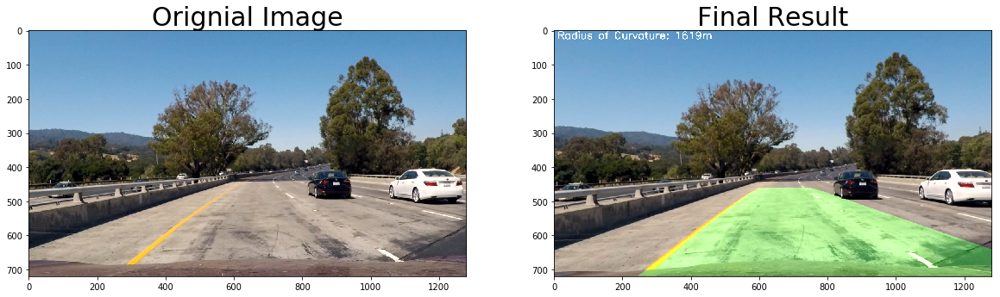

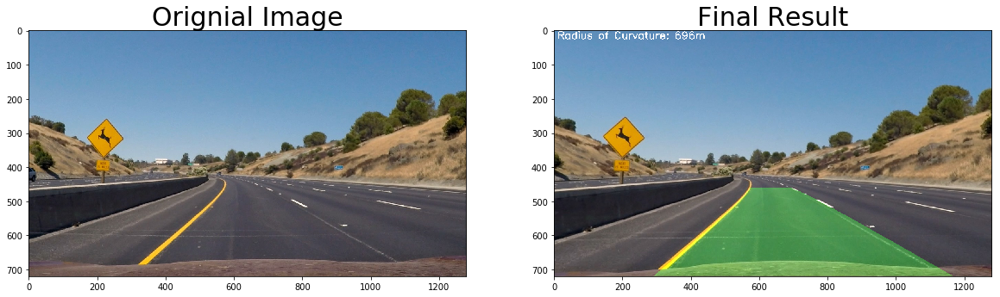

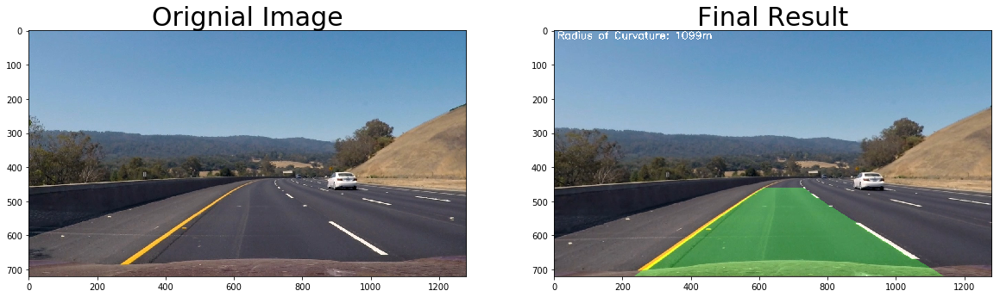

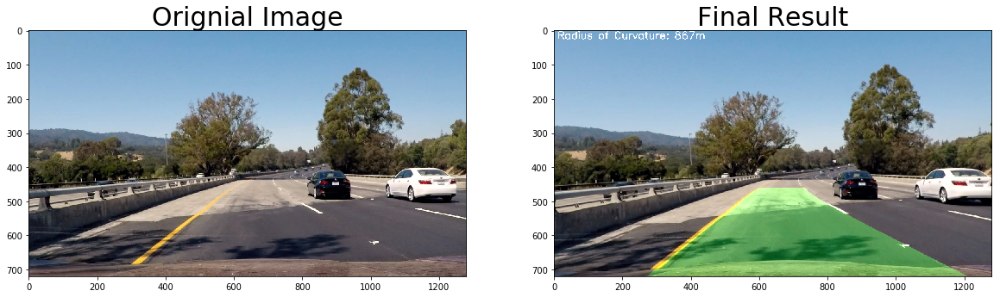

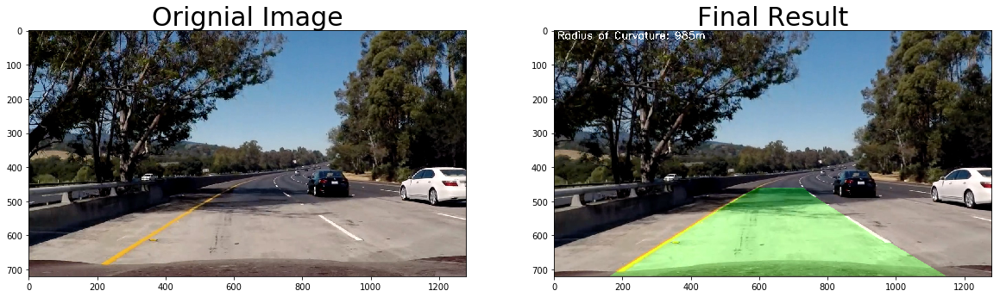

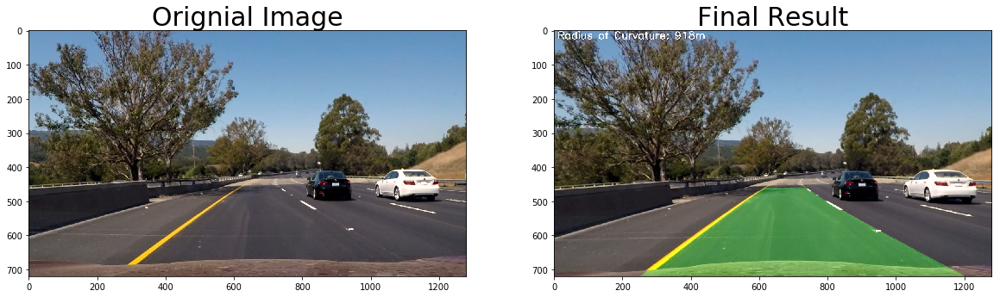

In [33]:
raw_images = glob.glob('test_images/*.jpg')
for image_name in raw_images:
    image = mpimg.imread(image_name)
    res = lanePipeline(image)
    # Visualize Warped Image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(image)
    ax1.set_title('Orignial Image', fontsize=30)
    ax2.imshow(res)
    ax2.set_title('Final Result', fontsize=30)

In [34]:
clip1 = VideoFileClip("project_video.mp4")
out_clip = clip1.fl_image(lanePipeline)
out_clip.write_videofile('project_video_out.mp4',audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [02:15<00:00,  9.37it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 



In [35]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('project_video_out.mp4'))